<a href="https://colab.research.google.com/github/polytron1/MY-Portofolio/blob/main/The_Change_Makers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Pendahuluan**

# **A. Bussiness Understanding**

Semakin berkembangnya zaman dan teknologi, persaingan pasar pun juga semakin ketat. Kini perusahaan berlomba-lomba dalam menyusun strategi pasar untuk memajukan perusahaannya. Berbagai cara dilakukan salah satunya dengan melihat pola penjualan dari waktu ke waktu. Disinilah Ilmu Statistika berperan. Dengan menggunakan ilmu statistika, khususnya forecasting, maka dapat diprediksi pola penjualan dari waktu ke waktu. Sehingga dapat membantu para pelaku usaha untuk menentukan kebijakan yang harus diambil.

Peramalan/ forecasting adalah suatu metode statistika yang digunakan untuk meminimumkan nilai eror pada hasil prediksi. Diharapkan dengan meminimumkan nilai eror ini, hasil prediksi yang didapatkan dapat mendekati nilai aktual sehingga dapat meminimumkan risiko kerugian dari sebuah kebijakan yang diambil

# **B. Data Understanding**

## **0. Import Library**

In [ ]:
#connect to drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

#change directory
%cd /content/drive/My\ Drive/

#change to spesific folder
%cd /content/drive/My\ Drive/Dataset_Project/Final_Project/marketing

!pwd

Mounted at /content/drive
/content/drive/My Drive
/content/drive/My Drive/Dataset_Project/Final_Project/marketing
/content/drive/My Drive/Dataset_Project/Final_Project/marketing


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
import datetime
import time
import calendar

from pylab import rcParams
rcParams['figure.figsize'] = 25, 15

Mengimpor library yang dibutuhkan untuk analisis

## **1. Import Dataset**

In [ ]:
#import the dataset
raw_train = pd.read_csv('train.csv')
raw_test = pd.read_csv('test.csv')
raw_holiday = pd.read_csv('holidays_events.csv')
raw_oil = pd.read_csv('oil.csv')
raw_stores = pd.read_csv('stores.csv')
raw_transaction = pd.read_csv('transactions.csv')

# **C. Data Preparation**

## **1. Exploratory Data Analysis**

### 1.1. Features Checking

In [ ]:
datasets = [raw_train, raw_test, raw_holiday, raw_oil, raw_stores, raw_transaction]
titles = ['train', 'test', 'holiday', 'oil', 'stores', 'transaction']

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
features_check = pd.DataFrame({}, )
features_check['datasets'] = titles

features_check['numeric_features'] = [len((df.select_dtypes(include = numerics)).columns) for df in datasets]
features_check['numerical_features_name'] = [', '.join(list((df.select_dtypes(include = numerics)).columns)) for df in datasets]
features_check['categorical_features'] = [len((df.select_dtypes(include = 'object')).columns) for df in datasets]
features_check['categorical_features_name'] = [', '.join(list((df.select_dtypes(include = 'object')).columns)) for df in datasets]
features_check['boolean_features'] = [len((df.select_dtypes(include = 'bool')).columns) for df in datasets]
features_check['boolean_features_name'] = [', '.join(list((df.select_dtypes(include = 'bool')).columns)) for df in datasets]
features_check['total_columns'] = [len(df.columns) for df in datasets]
features_check['total_rows'] = [len(df) for df in datasets]
features_check.style.background_gradient(cmap = 'Blues')

,datasets,numeric_features,numerical_features_name,categorical_features,categorical_features_name,boolean_features,boolean_features_name,total_columns,total_rows
0,train,4,"id, store_nbr, sales, onpromotion",2,"date, family",0,,6,3000888
1,test,3,"id, store_nbr, onpromotion",2,"date, family",0,,5,28512
2,holiday,0,,5,"date, type, locale, locale_name, description",1,transferred,6,350
3,oil,1,dcoilwtico,1,date,0,,2,1218
4,stores,2,"store_nbr, cluster",3,"city, state, type",0,,5,54
5,transaction,2,"store_nbr, transactions",1,date,0,,3,83488


Dilakukan Feature Checking untuk melihat fitur-fitur yang ada di setiap data beserta tipe nya


### 1.2. Display Data Frame

In [ ]:
##Melihat 5 data teratas dari data train
raw_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [ ]:
##Melihat 5 data teratas dari data test
raw_test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [ ]:
##Melihat 5 data teratas dari data holiday
raw_holiday.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [ ]:
##Melihat 5 data teratas dari data oil
raw_oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [ ]:
##Melihat 5 data teratas dari data stores
raw_stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [ ]:
raw_transaction.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


### 1.3. Date Correction

In [ ]:
##Mengubah Format tanggal agar mudah dianalisis
raw_train['date'] = raw_train['date'].astype('datetime64[ns]')
raw_test['date'] = raw_test['date'].astype('datetime64[ns]')
raw_holiday['date'] = raw_holiday['date'].astype('datetime64[ns]')
raw_oil['date'] = raw_oil['date'].astype('datetime64[ns]')
raw_transaction['date'] = raw_transaction['date'].astype('datetime64[ns]')

### 1.4. Missing Value Checking and Handling

#### 1.4.1 Overall Data Missing Value Checking

In [ ]:
##Mengecek ada tidaknya missing value
datasets = [raw_train, raw_test, raw_holiday, raw_oil, raw_stores, raw_transaction]
titles = ['train', 'test', 'holiday', 'oil', 'stores', 'transaction']

missing_check = pd.DataFrame({}, )
missing_check['datasets'] = titles
missing_check['features'] = [', '.join([col for col, null in df.isnull().sum().items()]) for df in datasets]
missing_check['null_amount'] = [df.isnull().sum().sum() for df in datasets]
missing_check['null_features_amount'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]
missing_check['null_features'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]
missing_check.style.background_gradient(cmap='Blues')

,datasets,features,null_amount,null_features_amount,null_features
0,train,"id, date, store_nbr, family, sales, onpromotion",0,0,
1,test,"id, date, store_nbr, family, onpromotion",0,0,
2,holiday,"date, type, locale, locale_name, description, transferred",0,0,
3,oil,"date, dcoilwtico",43,1,dcoilwtico
4,stores,"store_nbr, city, state, type, cluster",0,0,
5,transaction,"date, store_nbr, transactions",0,0,


#### 1.4.2 Missing Value Handling On Oil Data

In [ ]:
##Penanganan missing value dengan mengisi nilai yang kosong
raw_oil['dcoilwtico'] = raw_oil['dcoilwtico'].fillna(method = "ffill")

In [ ]:
##Memastikan sudah tidak ada missing value
raw_oil.isnull().sum()

date          0
dcoilwtico    0
dtype: int64

### 1.5. Data Visualizations

#### 1.5.1. Train

In [ ]:
train_vis = raw_train
train_vis['year'] = train_vis['date'].dt.year
train_vis['month'] = train_vis['date'].dt.month
train_vis['day'] = train_vis['date'].dt.day
train_vis['weekday'] = train_vis['date'].dt.dayofweek
train_vis['day_name'] = train_vis['date'].dt.day_name()

<Axes: xlabel='year'>

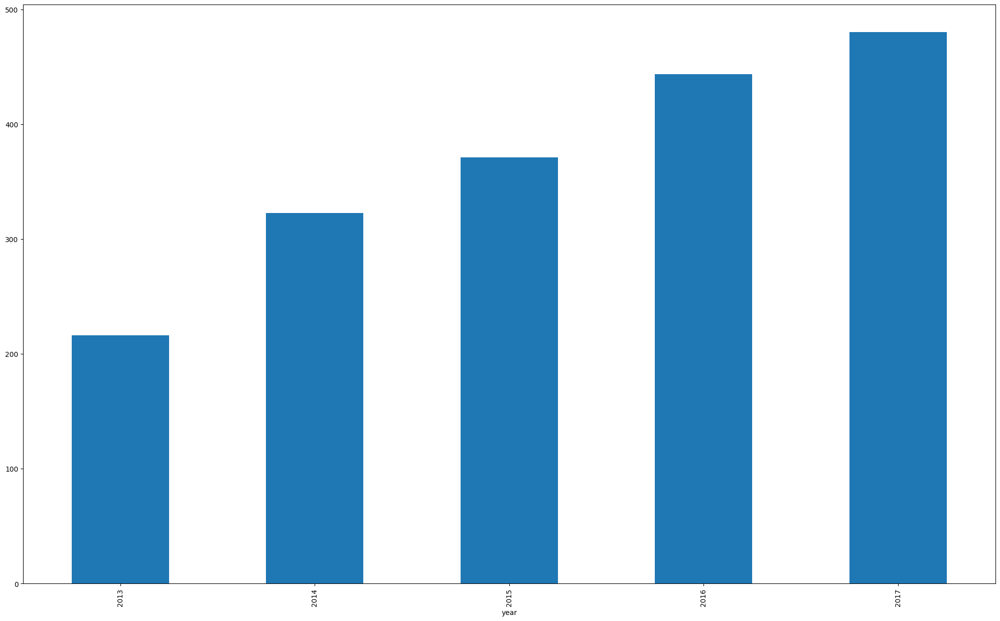

In [ ]:
train_vis.groupby('year')['sales'].mean().plot.bar()

Interpretasi : Terdapat peningkatan rata-rata penjualan yang konstan dimulai dari tahun 2013 hingga tahun 2017.


<Axes: xlabel='month'>

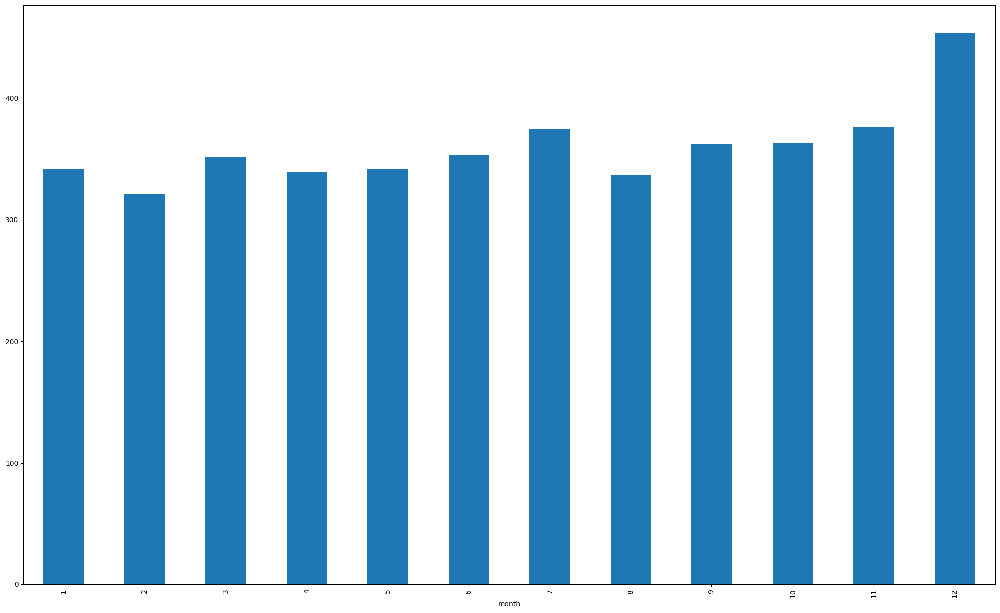

In [ ]:
train_vis.groupby('month')['sales'].mean().plot.bar()

Rata-rata penjualan cukup fluktuatif pada bulan Januari hingga bulan Desember. Rata-rata penjualan tertinggi terjadi pada bulan Desember yang dapat disebabkan oleh akhir tahun sehingga peningkatan rata-rata penjualan berubah secara signifikan dari bulan sebelumnya, yakni bulan November

<Axes: xlabel='day'>

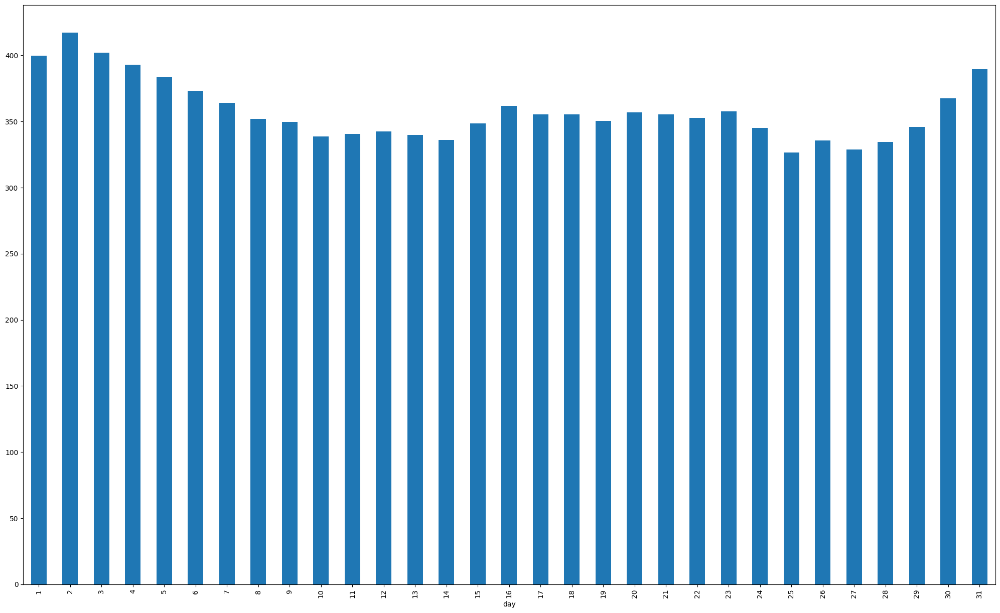

In [ ]:
train_vis.groupby('day')['sales'].mean().plot.bar()

Rata-rata penjualan cukup fluktuatif dari tanggal 1 hingga tanggal 31. Rata-rata penjualan tertinggi terjadi pada tanggal 2

<Axes: xlabel='weekday,day_name'>

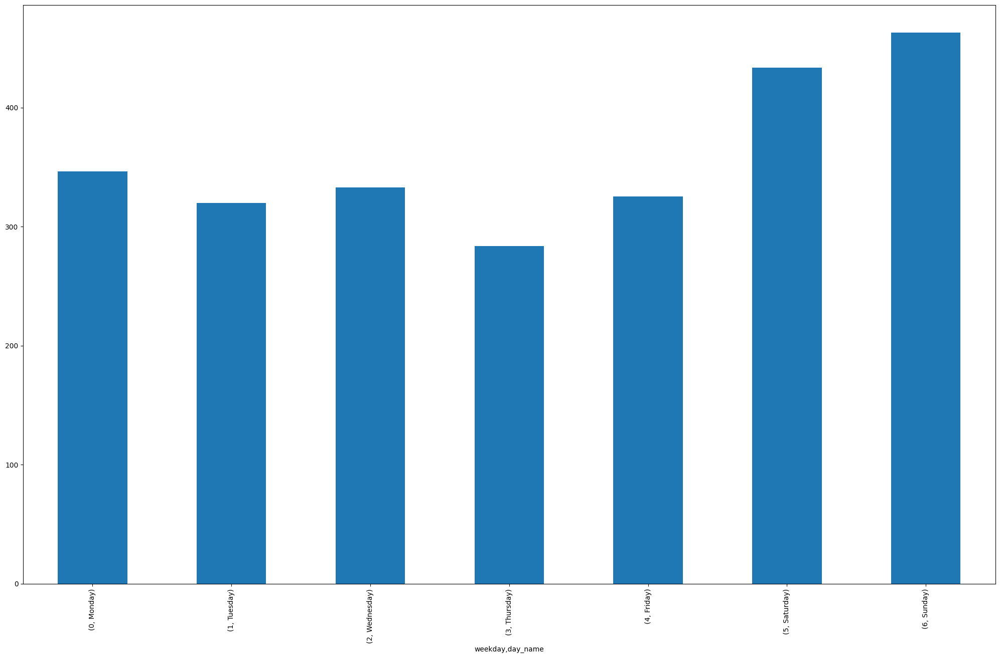

In [ ]:
train_vis.groupby(['weekday','day_name'])['sales'].mean().plot.bar()

Rata-rata penjualan tertinggi terjadi pada hari Minggu yang dapat disebabkan karena banyak orang tidak memiliki aktivitas seperti bekerja, sehingga memiliki waktu luang lebih banyak untuk melakukan transaksi penjualan

<Axes: xlabel='date'>

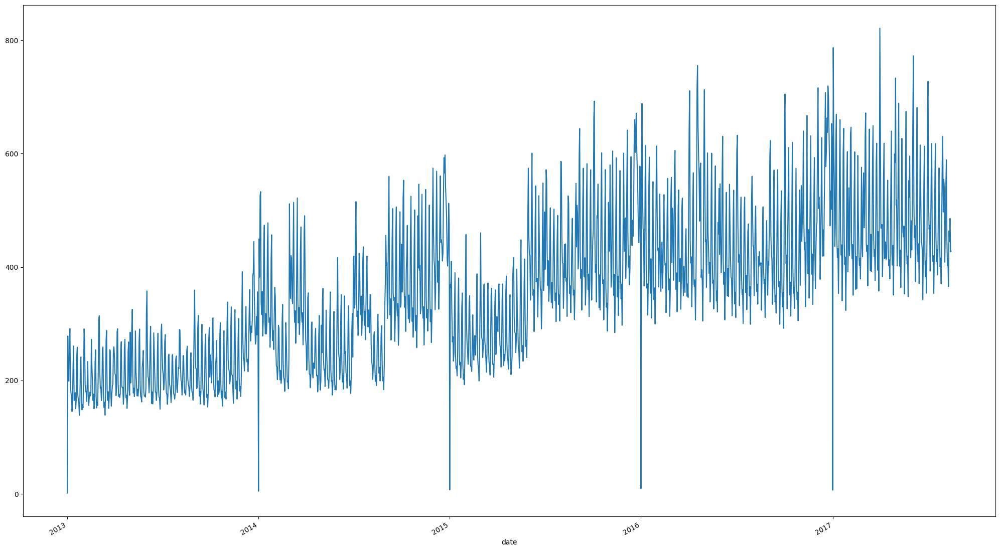

In [ ]:
train_vis.groupby('date')['sales'].mean().plot.line()

Penjualan setiap tahunnya cenderung meningkat, namun pada tanggal 1 bulan Januari setiap tahunnya selalu mengalami rata-rata penjualan 0 dikarenakan hari tersebut merupakan hari libur khusus tahun baru. Sehingga, toko tidak melakukan kegiatan transaksi jual beli. Melalui grafik diatas, bulan Desember memiliki rata-rata penjualan tertinggi setiap tahunnya

<Axes: xlabel='onpromotion', ylabel='sales'>

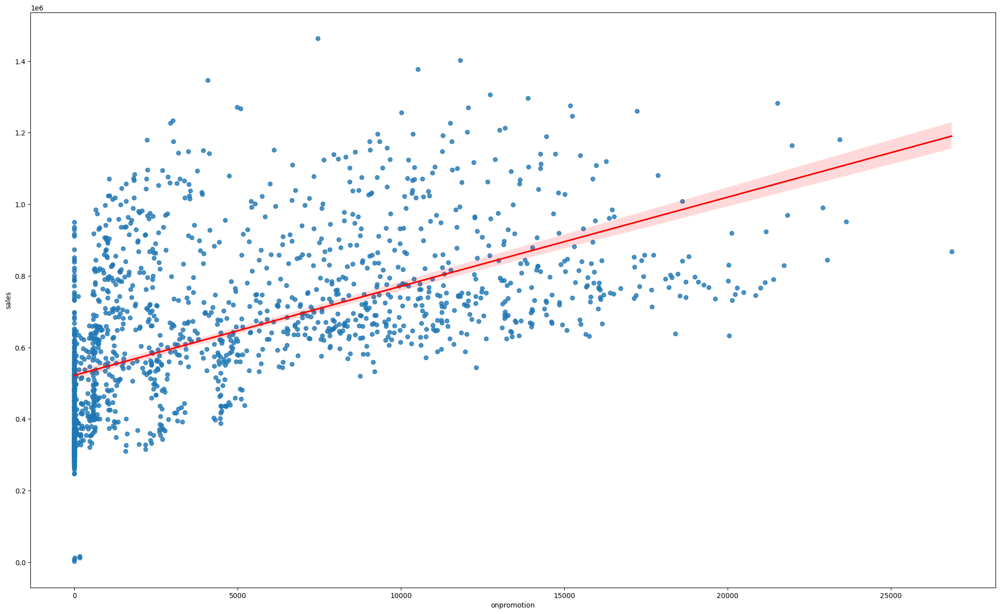

In [ ]:
p = train_vis[['date', 'sales', 'onpromotion']]
p = p.groupby('date').sum()
sns.regplot(x = p['onpromotion'], y = p['sales'], line_kws = {"color": "red"})

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
train = train['sales']

In [ ]:
# assuming your time series data is stored in a variable called 'ts'
result = adfuller(temp_sales)

print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.616196
p-value: 0.089696
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568


Penjabaran : Karena Nilai p-value = 0,089696 yang mana lebih dari 0,05, maka kita dapat menolak hipotesis nol dengan tingkat kepercayaan 95%, dan menyimpulkan bahwa **data bukan merupakan time series stasioner.**

In [ ]:
import plotly.express as px

df_store = raw_train[['store_nbr', 'sales']].groupby('store_nbr').mean().sort_values('sales', ascending=False)
df_store = df_store.reset_index()
df_store['sales'] = df_store['sales']
df_store = pd.merge(df_store, raw_stores, how='left')
df_store['store_nbr'] = df_store['store_nbr'].astype(str)

fig = px.bar(df_store, x='store_nbr', y='sales', color='type', category_orders={"store_nbr": list(df_store['store_nbr']),
                             "sales": list(df_store['sales'])
                              })
fig.update_layout({"title": f'Rata-rata penjualan setiap store number',
                   "xaxis": {"title":"Store number"},
                   "yaxis": {"title":"Rata-rata Jumlah Produk terjual"},
                   "showlegend": True})

In [ ]:
df_product = raw_train[['family', 'sales']].groupby('family').mean().sort_values('sales', ascending = True).tail()
df_product = df_product.reset_index()
df_product['sales'] = df_product['sales']
fig = px.bar(df_product,  x='sales', y='family', color='sales', color_continuous_scale="earth")
fig.update_layout({"title": f'5 Kategori Produk dengan Rata-rata Penjualan Tertinggi',
                   "xaxis": {"title":"Rata-rata produk terjual"},
                   "yaxis": {"title":"Kategori Produk"},
                   "showlegend": True},
                 width=1000,
                height=700)

fig.show()

Rata-rata penjualan tertinggi berada pada kategori grocery, sedangkan rata-rata penjualan terendah berada pada kategori dairy.

#### 1.5.2. Transaction

<Axes: xlabel='date'>

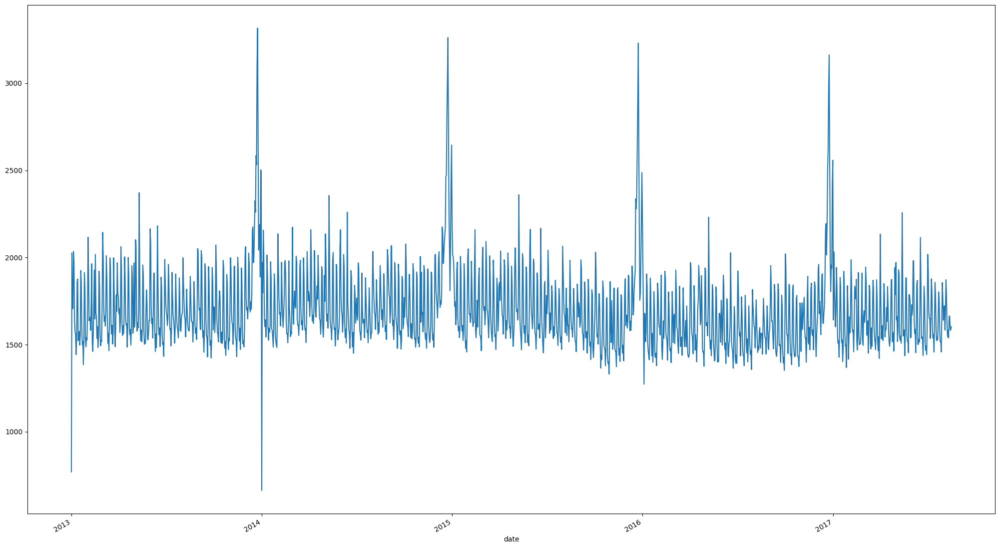

In [ ]:
raw_transaction.groupby(['date'])['transactions'].mean().plot.line()

<Axes: xlabel='store_nbr'>

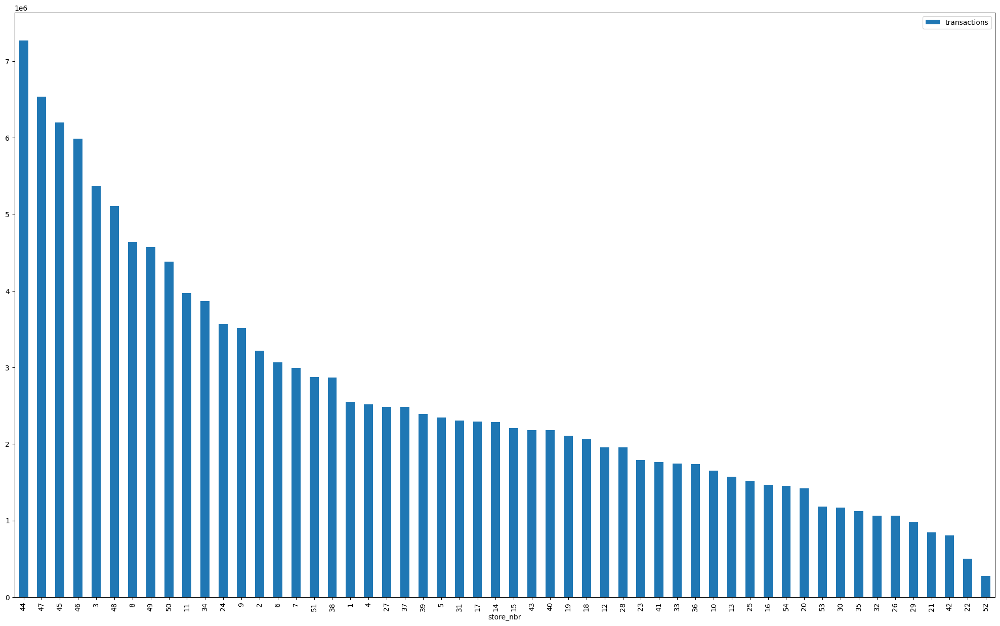

In [ ]:
raw_transaction.drop(['date'], axis = 1).groupby(['store_nbr']).sum().sort_values(by = 'transactions', ascending = False).plot.bar()

#### 1.5.3. Oil

<function matplotlib.pyplot.show(close=None, block=None)>

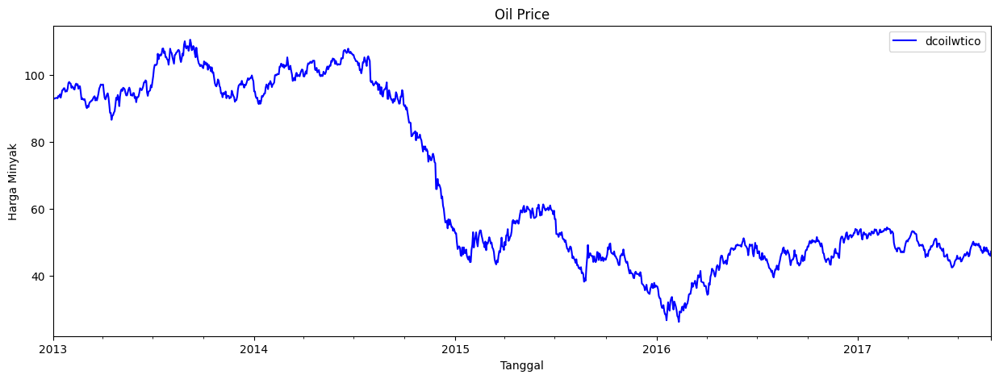

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15,5))
raw_oil.plot.line(x = "date", y="dcoilwtico", color = "blue", ax = axes)
plt.title("Oil Price")
plt.ylabel('Harga Minyak')
plt.xlabel('Tanggal')
plt.show

#### 1.5.4. Stores

In [ ]:
def plot_stats(df, column, ax,color,angle):
    count_classes = df[column].value_counts().sort_values(ascending = False)
    ax = sns.barplot(x=count_classes.index, y=count_classes, ax=ax, palette=color)
    ax.set_title(column.upper(), fontsize=15)
    for tick in ax.get_xticklabels():
        tick.set_rotation(angle)

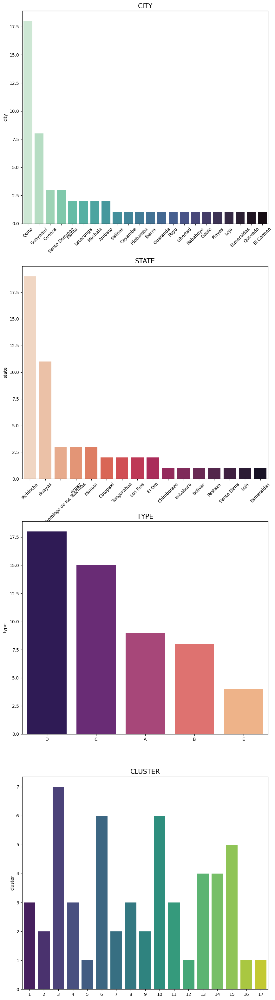

In [ ]:
fig, axes = plt.subplots(nrows = 4, ncols=1, figsize=(10, 40))
plot_stats(raw_stores, "city", axes[0], "mako_r", 45)
plot_stats(raw_stores, "state", axes[1], "rocket_r", 45)
plot_stats(raw_stores, "type", axes[2], "magma", 0)
plot_stats(raw_stores, "cluster", axes[3], "viridis", 0)

In [ ]:
from sklearn.preprocessing import LabelEncoder

vis_df_stores = raw_stores
#melakukan encoding
labelencoder = LabelEncoder()
vis_df_stores['city']= labelencoder.fit_transform(vis_df_stores['city'])
vis_df_stores['state']= labelencoder.fit_transform(vis_df_stores['state'])
vis_df_stores['type']= labelencoder.fit_transform(vis_df_stores['type'])

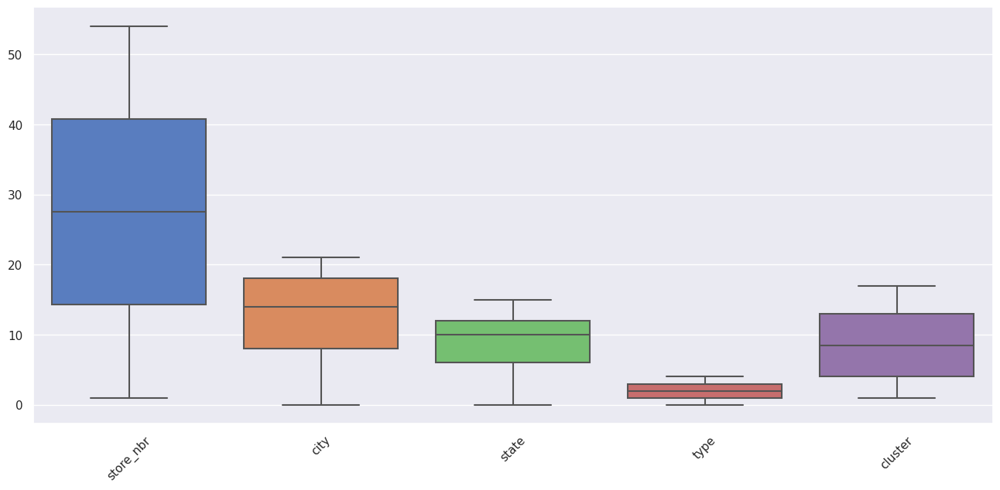

In [ ]:
#check outliers
sns.set(style="darkgrid", palette="muted")
fig, ax = plt.subplots(figsize=(16,7))
sns.boxplot(data = raw_stores)
plt.xticks(rotation=45)
plt.show()

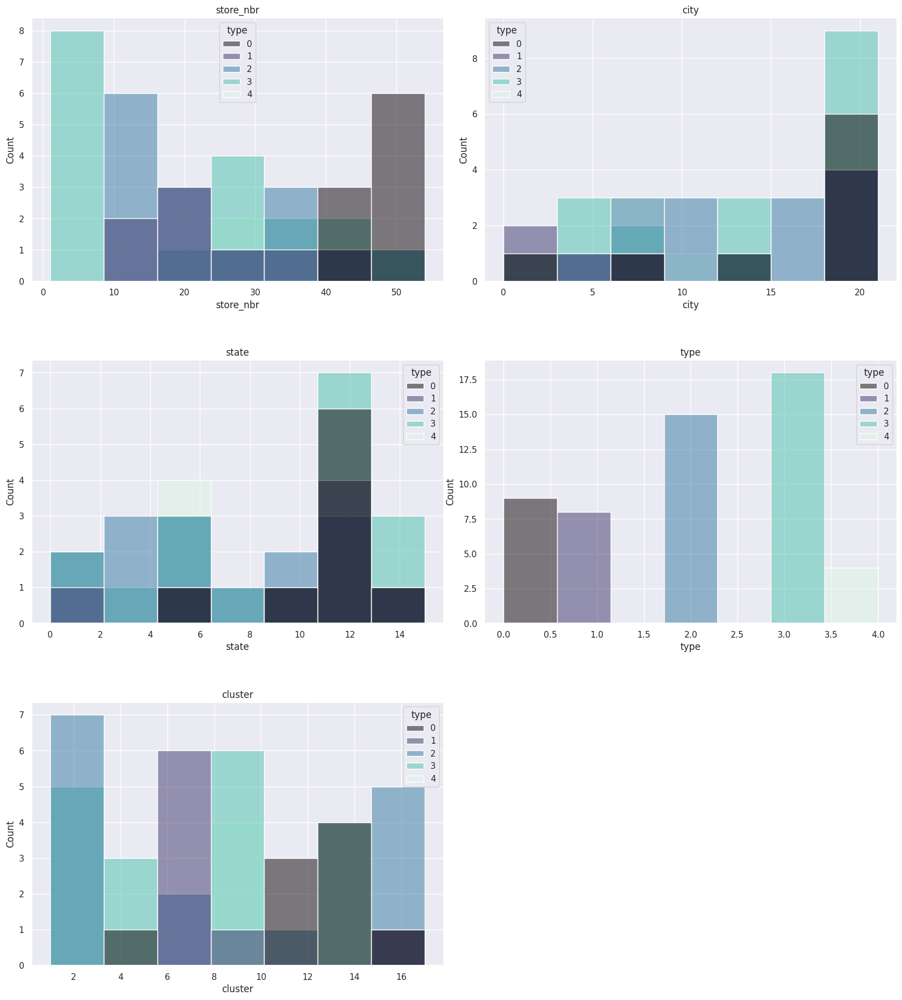

In [ ]:
#melihat distribusi data antarvariabel dan class
plt.figure(figsize=(20, 30))

# desc
a = 4  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

columns = vis_df_stores
target = vis_df_stores['type']

for col in columns:
    plt.subplot(a, b, c)
    sns.histplot(data = vis_df_stores, x=col, hue="type", palette="mako")
    plt.title(f'{col}')
    plt.subplots_adjust(wspace=0.1, hspace=0.3)
    c += 1

#### 1.5.5. Holiday

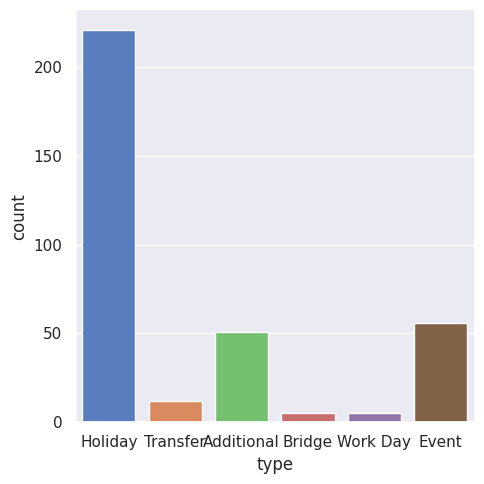

In [ ]:
sns.catplot(raw_holiday, kind = 'count', x = 'type')

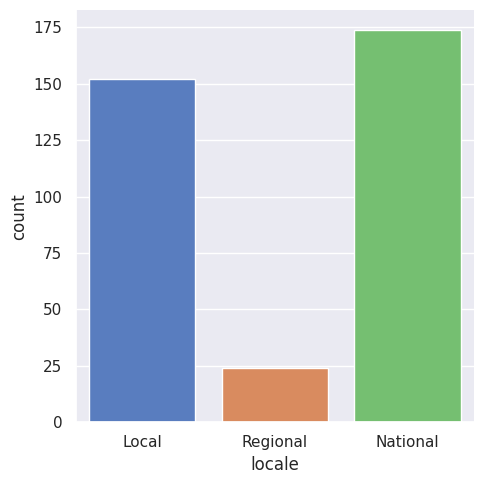

In [ ]:
sns.catplot(raw_holiday, kind = 'count', x = 'locale')

### 1.6. Automated EDA

In [ ]:
!pip install dataprep
from dataprep.eda import create_report

Menggunakan library open-source dataprep untuk melihat insight dan visualisasi dari dataset hanya dengan menggunakan beberapa baris code.

#### 1.6.1. Train Data

In [ ]:
auto_train = raw_train.drop('id', axis = 1)

Menghapus kolom id

In [ ]:
create_report(auto_train).show()

Menggunakan fungsi create report untuk melihat overview, variables, Quantile statistics, Descriptive statistics, Missing Values, dan Correlation dari dataset train. Insight dari automated EDA untuk data Train adalah dari data train tidak terdapat Missing value dan nilai yang duplikat. Selain itu, terdapat korelasi yang tinggi antara sales dan onpromotion, serta dari hasil visualisasi dengan scatterplot didapatkan bahwa store number 42 terdapat jumlah sales yang tinggi.

#### 1.6.2. Transaction

The plot will not show in a notebook environment, please try 'show_browser' if you want to open it in browser



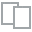
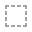
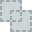
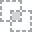
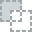
...
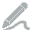
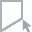
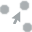
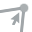
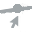

In [ ]:
create_report(raw_transaction).show()

Membuat report untuk melihat overview, variables, Quantile statistics, Descriptive statistics, Missing Values, dan Correlation dari dataset Transaction. Insight dari automated EDA untuk data Transaction adalah dari data Transaction tidak terdapat Missing value dan nilai yang duplikat.

#### 1.6.3. Oil

The plot will not show in a notebook environment, please try 'show_browser' if you want to open it in browser



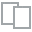
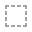
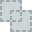
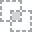
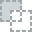
...
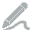
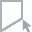
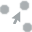
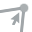
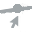

In [ ]:
create_report(raw_oil).show()

Membuat report untuk melihat overview, variables, Quantile statistics, Descriptive statistics, Missing Values, dan Correlation dari dataset Oil. Insight dari automated EDA untuk data Oil adalah dari data Oil ini tidak terdapat Missing value dan nilai yang duplikat karena sebelumnya missing value telah ditangani dengan mengisi nilai yang kosong.

#### 1.6.4. Stores

In [ ]:
create_report(raw_stores).show()

Membuat report untuk melihat overview, variables, Quantile statistics, Descriptive statistics, Missing Values, dan Correlation dari dataset Stores. Insight dari automated EDA untuk data Stores adalah dari data Stores tidak terdapat Missing value dan nilai yang duplikat. Dari Visualisasi yang ada, city 18 memiliki jumlah frekuensi yang lebih banyak dibandingkan yang lainnya, type 3 memiliki jumlah yang tertinggi, serta cluster 3 memiliki frekuensi yang tertinggi.

#### 1.6.5. Holiday

/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

The plot will not show in a notebook environment, please try 'show_browser' if you want to open it in browser



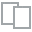
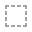
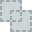
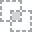
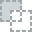
...
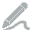
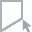
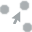
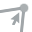
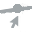

In [ ]:
create_report(raw_holiday).show()

Membuat report untuk melihat overview, variables, Quantile statistics, Descriptive statistics, Missing Values, dan Correlation dari dataset Holiday. Insight dari automated EDA untuk data Holiday adalah dari data Holiday tidak terdapat Missing value dan nilai yang duplikat.

## **2. Data Preprocessing**

### 2.1. Merge Dataset

#### 2.1.1. Train Dataset

Menggabungkan raw dari data train, holiday, oil, stores, dan transaction dalam satu raw berdasarkan 'date'.

In [ ]:
raw_holiday['type'].replace('Transfer', 'Normal', inplace = True)
df = raw_train.merge(raw_holiday, on = 'date', how = 'left')
df = df.merge(raw_oil, on = 'date', how = 'left')
df = df.merge(raw_stores, on = 'store_nbr', how = 'left')
df = df.merge(raw_transaction, on = ['date', 'store_nbr'], how = 'left')
df = df.rename(columns = {'type_x' : "holiday_type", "type_y" : "store_type"})

In [ ]:
df['holiday_type'] = df['holiday_type'].replace({np.nan : "Normal"})
df['transactions'] = df['transactions'].fillna(0)
df['dcoilwtico'] = df['dcoilwtico'].fillna(method = 'ffill').fillna(method = 'bfill')
df['day_of_week'] = df['date'].dt.day_name()
df['unique_id'] = df['store_nbr'].astype(str) + '_' + df['family']
df.head()

,id,date,store_nbr,family,sales,onpromotion,year,month,day,weekday,...,description,transferred,dcoilwtico,city,state,store_type,cluster,transactions,day_of_week,unique_id
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,1,1,1,...,Primer dia del ano,False,93.14,18,12,3,13,0.0,Tuesday,1_AUTOMOTIVE
1,1,2013-01-01,1,BABY CARE,0.0,0,2013,1,1,1,...,Primer dia del ano,False,93.14,18,12,3,13,0.0,Tuesday,1_BABY CARE
2,2,2013-01-01,1,BEAUTY,0.0,0,2013,1,1,1,...,Primer dia del ano,False,93.14,18,12,3,13,0.0,Tuesday,1_BEAUTY
3,3,2013-01-01,1,BEVERAGES,0.0,0,2013,1,1,1,...,Primer dia del ano,False,93.14,18,12,3,13,0.0,Tuesday,1_BEVERAGES
4,4,2013-01-01,1,BOOKS,0.0,0,2013,1,1,1,...,Primer dia del ano,False,93.14,18,12,3,13,0.0,Tuesday,1_BOOKS


Mengisi data yang kosong dan menambahkan kolom baru 'day of week dan 'unique id'
- 'day of weak' berisi nama hari dalam bahasa Inggris berdasarkan tanggal yang ada dalam kolom 'date'.
- 'unique id' berisi kombinasi dari nilai kolom 'store_nbr' yang diubah menjadi string (astype(str)) dan nilai kolom 'family'.

#### 2.1.2. Test Dataset

In [ ]:
test = raw_test.merge(raw_holiday, on = 'date', how = 'left')
test = test.merge(raw_oil, on = 'date', how = 'left')
test = test.merge(raw_stores, on = 'store_nbr', how = 'left')
test.rename(columns = {'type_x' : "holiday_type", "type_y" : "store_type"}, inplace = True)
test['holiday_type'] = test['holiday_type'].replace({np.nan : "Normal"})
test['day_of_week'] = test['date'].dt.day_name()
test['dcoilwtico'] = test['dcoilwtico'].fillna(method = 'ffill').fillna(method = 'bfill')
test

,id,date,store_nbr,family,onpromotion,holiday_type,locale,locale_name,description,transferred,dcoilwtico,city,state,store_type,cluster,day_of_week
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Normal,NaN,NaN,NaN,NaN,46.80,18,12,3,13,Wednesday
1,3000889,2017-08-16,1,BABY CARE,0,Normal,NaN,NaN,NaN,NaN,46.80,18,12,3,13,Wednesday
2,3000890,2017-08-16,1,BEAUTY,2,Normal,NaN,NaN,NaN,NaN,46.80,18,12,3,13,Wednesday
3,3000891,2017-08-16,1,BEVERAGES,20,Normal,NaN,NaN,NaN,NaN,46.80,18,12,3,13,Wednesday
4,3000892,2017-08-16,1,BOOKS,0,Normal,NaN,NaN,NaN,NaN,46.80,18,12,3,13,Wednesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1,Normal,NaN,NaN,NaN,NaN,47.26,18,12,1,6,Thursday
28508,3029396,2017-08-31,9,PREPARED FOODS,0,Normal,NaN,NaN,NaN,NaN,47.26,18,12,1,6,Thursday
28509,3029397,2017-08-31,9,PRODUCE,1,Normal,NaN,NaN,NaN,NaN,47.26,18,12,1,6,Thursday
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,Normal,NaN,NaN,NaN,NaN,47.26,18,12,1,6,Thursday


- Menggabungkan raw dari data test, oil, dan stores menajadi satu raw data berdasarkan 'date'
- Mengisi data yang kosong dan menambahkan kolom baru 'day of week dan 'unique id'

#### 2.1.3. Drop Unnecessary Column

In [ ]:
df = df.drop(['locale', 'locale_name', 'description', 'transferred'], axis = 1)

Menghilangkan kolom 'locale', 'locale_name', description', 'transferred'. pada raw data df

In [ ]:
test = test.drop(['locale', 'locale_name', 'description', 'transferred'], axis = 1)

Menghilangkan kolom 'locale', 'locale_name', description', 'transferred'. pada raw data test

### 2.2. Missing Value Check On Merged Dataset

In [ ]:
def data_check(df):
    missing = df.isnull().sum()
    not_miss = df.notnull().sum()
    per_mis = 100*(missing/len(df))
    data_type = df.dtypes
    number_unique = df.nunique()
    return pd.DataFrame({"Missing" : missing,
                         "Non Missing" : not_miss,
                        "Percent_Missing" : per_mis,
                        "data_type": data_type,
                        "number_unique" : number_unique})

Check missing value dengan membuat dictionary baru yang berisi 'missing', 'non missing', percent_missing', 'data_type', dan 'number_unique'.

In [ ]:
data_check(df)

,Missing,Non Missing,Percent_Missing,data_type,number_unique
id,0,3054348,0.0,int64,3000888
date,0,3054348,0.0,datetime64[ns],1684
store_nbr,0,3054348,0.0,int64,54
family,0,3054348,0.0,object,33
sales,0,3054348,0.0,float64,379610
onpromotion,0,3054348,0.0,int64,362
year,0,3054348,0.0,int64,5
month,0,3054348,0.0,int64,12
day,0,3054348,0.0,int64,31
weekday,0,3054348,0.0,int64,7


In [ ]:
data_check(test)

,Missing,Non Missing,Percent_Missing,data_type,number_unique
id,0,28512,0.0,int64,28512
date,0,28512,0.0,datetime64[ns],16
store_nbr,0,28512,0.0,int64,54
family,0,28512,0.0,object,33
onpromotion,0,28512,0.0,int64,212
holiday_type,0,28512,0.0,object,2
dcoilwtico,0,28512,0.0,float64,11
city,0,28512,0.0,int64,22
state,0,28512,0.0,int64,16
store_type,0,28512,0.0,int64,5


isi dari dictionary baru pada df

- "Missing": Jumlah nilai yang hilang untuk setiap kolom.
- "Non Missing": Jumlah nilai yang tidak hilang untuk setiap kolom.
- "Percent_Missing": Persentase nilai yang hilang untuk setiap kolom.
- "data_type": Tipe data untuk setiap kolom.
- "number_unique": Jumlah nilai unik untuk setiap kolom.

### 2.3. Feature Engineering

#### 2.3.1. Forecast Transactions For Data Test Date Range

Install pyspark

In [ ]:
!pip install pyspark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.4.0-py2.py3-none-any.whl size=311317130 sha256=e9f92bec4b7d26a7e882b55ac6f024700b4501a158c7ff217d4ba92cc683c6c8
  Stored in directory: /root/.cache/pip/wheels/7b/1b/4b/3363a1d04368e7ff0d408e57ff57966fcdf00583774e761327
Successfully built pyspark


Membuat raw baru 'forecast_transaction' dari 'raw_transaction' dan mengubah kolom di dalamnya.

In [ ]:
forecast_transactions = raw_transaction
forecast_transactions.rename(columns = {'date' : 'ds', 'store_nbr' : 'unique_id', 'transactions' : 'y'}, inplace = True)

Mengubah nama kolom pada raw forecast_transaction:
- 'date' = 'ds'
- 'store_nbr' = 'unique_id'
- 'tansaction' = 'y'

Mengelompokkan 'forecast_transaction' berdasarkan kolom 'unique_id'

In [ ]:
groups_by_ticker = forecast_transactions.groupby('unique_id')
groups_by_ticker.groups.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54])

In [ ]:
from pyspark.sql.types import *
from pyspark.sql.functions import pandas_udf, PandasUDFType
from pyspark.sql import SparkSession

spark = SparkSession.builder.master("local[*]").getOrCreate()
spark

Melakukan forecast menggunakan prophet

In [ ]:
from prophet import Prophet

def train_and_forecast(group):
  # Initiate the model
  m = Prophet()

  # Fit the model
  m.fit(group)
  # Make predictions
  future = m.make_future_dataframe(periods = 16)
  forecast = m.predict(future)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
  forecast['unique_id'] = group['unique_id'].iloc[0]

  # Return the forecasted results
  return forecast[['ds', 'unique_id', 'yhat', 'yhat_upper', 'yhat_lower']]

memprediksi nilai 'y' di masa depan untuk 16 hari ke depan.
- 'ds' = tanggal
- 'unique_id'
- 'yhat' = nilai yang diprediksi
- 'yhat_upper' = batas atas prediksi
- 'yhat_lower'= batas bawah predsiksi

In [ ]:
# Convert the pandas dataframe into a spark dataframe
sdf = spark.createDataFrame(forecast_transactions)
# Define the restult schema
result_schema =StructType([
  StructField('ds',DateType()),
  StructField('unique_id',IntegerType()),
  StructField('yhat',FloatType()),
  StructField('yhat_upper',FloatType()),
  StructField('yhat_lower',FloatType())
  ])
# Train and forecast by ticker
spark_forecast = sdf.groupBy('unique_id').applyInPandas(train_and_forecast, schema=result_schema)
# Take a look at the results
spark_forecast.show(10)

+----------+---------+---------+----------+----------+
|        ds|unique_id|     yhat|yhat_upper|yhat_lower|
+----------+---------+---------+----------+----------+
|2013-01-02|        1|1975.7731| 2249.8704| 1672.5294|
|2013-01-03|        1|1825.4083| 2114.5042| 1580.3322|
|2013-01-04|        1|1825.4293|  2112.283| 1531.9036|
|2013-01-05|        1|1346.4124|  1634.385| 1065.3853|
|2013-01-06|        1| 539.9124|  826.1622| 240.94884|
|2013-01-07|        1|1741.2435| 2033.1699|   1446.62|
|2013-01-08|        1|1744.4973| 2028.5839|  1477.732|
|2013-01-09|        1|1861.7985| 2143.9373| 1573.6293|
|2013-01-10|        1| 1725.354| 2009.2921|  1438.221|
|2013-01-11|        1|1740.4406| 2036.0815| 1441.7709|
+----------+---------+---------+----------+----------+
only showing top 10 rows



DataFrame Spark 'spark_forecast' berisi hasil ramalan berdasarkan grup 'unique_id'

In [ ]:
transactions_forecast = spark_forecast.toPandas().rename(columns = {'ds' : 'date', 'unique_id' : 'store_nbr'})
transactions_forecast['date'] = transactions_forecast['date'].astype('datetime64[ns]')
transactions_forecast.head()

,date,store_nbr,yhat,yhat_upper,yhat_lower
0,2013-01-02,1,1975.773071,2249.870361,1672.529419
1,2013-01-03,1,1825.408325,2114.504150,1580.332153
2,2013-01-04,1,1825.429321,2112.282959,1531.903564
3,2013-01-05,1,1346.412354,1634.385010,1065.385254
4,2013-01-06,1,539.912415,826.162170,240.948837


Menampilkan DataFrame 'transaction_forecast' berupa kolom 'date', 'store_nbr', 'yhat', yhat_upper', 'yhat_lower'.

Menggabungkan raw data 'test' terhadap 'transactio_forecast' serta mengembalikan nama pelabelan kolom seperti diawal

In [ ]:
test = test.merge(transactions_forecast, on = ['date', 'store_nbr'], how = 'left')
test = test.drop(['yhat_upper', 'yhat_lower'], axis = 1)
test.rename(columns = {'yhat' : 'transactions'}, inplace = True)
test['unique_id'] = test['store_nbr'].astype(str) + '_' + test['family']
test.head()

,id,date,store_nbr,family,onpromotion,holiday_type,dcoilwtico,city,state,store_type,cluster,day_of_week,transactions,unique_id
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Normal,46.8,18,12,3,13,Wednesday,1741.481567,1_AUTOMOTIVE
1,3000889,2017-08-16,1,BABY CARE,0,Normal,46.8,18,12,3,13,Wednesday,1741.481567,1_BABY CARE
2,3000890,2017-08-16,1,BEAUTY,2,Normal,46.8,18,12,3,13,Wednesday,1741.481567,1_BEAUTY
3,3000891,2017-08-16,1,BEVERAGES,20,Normal,46.8,18,12,3,13,Wednesday,1741.481567,1_BEVERAGES
4,3000892,2017-08-16,1,BOOKS,0,Normal,46.8,18,12,3,13,Wednesday,1741.481567,1_BOOKS


Pada raw data 'test' yang baru terdapat kolom baru berupa 'transaction' (dari hasil peramalan prophet) dan 'unique_id' (berupa gabungan dari kolom 'store_nbr' dan 'family).

#### 2.3.2. One Hot Encoding

membuat raw data train 'df_train' dan data test 'df_test'

In [ ]:
df_train = df.drop(['day_of_week', 'year','month', 'day', 'weekday', 'day_name'], axis = 1)
df_test = test.drop('day_of_week', axis = 1)

- df_train = dari data asal 'df', menghilangkan kolom 'day_of_week', 'year', 'month', 'day', weekday', day_name'.
- df_test = dari data asal 'df', menghilangkan 'day_of_week'.

In [ ]:
from sklearn.preprocessing import LabelEncoder

cat_features = ['holiday_type', 'city', 'state', 'store_type', 'cluster', 'unique_id']
for col in cat_features:
    le = LabelEncoder()
    df_train[col] = le.fit_transform(df_train[col])
    df_test[col] = le.transform(df_test[col])

nilai-nilai kategorikal yang terdapat pada raw 'df_train' dan 'df_test' diubah menjadi numerik

#### 2.3.4. Stack Train and Test Data

In [ ]:
def concat_dfs(train, test):
    return pd.concat([df_train, test])

temp_df = concat_dfs(df_train, df_test)

#### 2.3.5. Create Lag Features

Mendefinisikan kembali 'temp_df' sehingga mengandung kolom-kolom baru yang merupakan _lag features_ dari kolom 'sales' yang ditandai dengan penamaan 'lag_'.

In [ ]:
def create_lags(df):

    new_df = df.copy()
    keys = ['store_nbr', 'family']
    val = 'sales'
    lags = [16, 21, 30, 45, 60, 90, 120, 365, 730]

    for lag in lags:
        new_df['lag_' + str(lag)] = new_df.groupby(keys)[val].transform(lambda x: x.shift(lag))

    return new_df

temp_df = create_lags(temp_df)

Mendefinisikan kembali 'temp_df' sehingga mengandung kolom-kolom baru yang merupakan rolling mean dari kolom 'sales' yang ditandai dengan penamaan 'SMA_'

In [ ]:
def create_rolling_mean(df):

    new_df = df.sort_values(["store_nbr", "family", "date"]).copy()
    shifts = [20, 30, 45, 60, 90, 120, 365, 730]

    for i in [20]:
        new_df["SMA"+str(i)+"_sales_lag16"] = new_df.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(16).values
        new_df["SMA"+str(i)+"_sales_lag30"] = new_df.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(30).values
        new_df["SMA"+str(i)+"_sales_lag60"] = new_df.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(60).values

    return new_df

temp_df = create_rolling_mean(temp_df)

Mendefinisikan kembali 'temp_df' sehingga mengandung kolom-kolom baru yang merupakan _exponential moving average_(EMA) dari kolom 'sales' yang ditandai dengan penamaan 'sales_ewm_alpha_' diikuti nilai alpha dan nilai lag.

In [ ]:
def create_exp_mov_av(df):

    new_df = df.copy()
    alphas = [0.95, 0.9, 0.8, 0.7, 0.5]
    lags = [16, 30, 60, 90]

    for alpha in alphas:
        for lag in lags:
            new_df['sales_ewm_alpha_' + str(alpha).replace(".", "") + "_lag_" + str(lag)] = \
                new_df.groupby(["store_nbr", "family"])['sales']. \
                    transform(lambda x: x.shift(lag).ewm(alpha=alpha).mean())

    new_df = new_df.sort_values(['id'])
    return new_df

temp_df = create_exp_mov_av(temp_df)

# **D. Modelling**

## **1. Prophet**

### 1.1. Train Test Model

In [ ]:
df_prophet = temp_df.drop('id', axis = 1)
df_prophet = df_prophet.rename(columns = {'date' : 'ds', 'sales' : 'y'})
df_prophet['y'] = np.log1p(df_prophet['y'])

In [ ]:
groups_by_ticker = df_prophet.groupby('unique_id')
groups_by_ticker.groups.keys()

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

In [ ]:
train = df_prophet[(df_prophet['ds'] < '2017-01-01')].fillna(0)
valid = df_prophet[df_prophet['ds'] >= '2017-01-01'].fillna(0)
h = valid['ds'].nunique()

In [ ]:
print(train.shape)
print(valid.shape)
print(h)

(2642706, 45)
(440154, 45)
243


In [ ]:
from prophet import Prophet
from joblib import Parallel, delayed

def prophet_model(train_, valid_, unique_id):
    print('unique_id:', unique_id)
    m = Prophet()
    m.add_regressor('onpromotion')
    m.add_regressor('dcoilwtico')
    m.add_regressor('holiday_type')
    m.add_regressor('city')
    m.add_regressor('state')
    m.add_regressor('store_type')
    m.add_regressor('cluster')
    m.add_regressor('transactions')
    m.add_regressor('lag_16')
    m.add_regressor('lag_21')
    m.add_regressor('lag_30')
    m.add_regressor('lag_45')
    m.add_regressor('lag_60')
    m.add_regressor('lag_90')
    m.add_regressor('lag_120')
    m.add_regressor('lag_365')
    m.add_regressor('lag_730')
    m.add_regressor('SMA20_sales_lag16')
    m.add_regressor('SMA20_sales_lag30')
    m.add_regressor('SMA20_sales_lag60')
    m.add_regressor ('sales_ewm_alpha_095_lag_16')
    m.add_regressor ('sales_ewm_alpha_095_lag_30')
    m.add_regressor ('sales_ewm_alpha_095_lag_60')
    m.add_regressor ('sales_ewm_alpha_095_lag_90')
    m.add_regressor ('sales_ewm_alpha_09_lag_16')
    m.add_regressor ('sales_ewm_alpha_09_lag_30')
    m.add_regressor ('sales_ewm_alpha_09_lag_60')
    m.add_regressor ('sales_ewm_alpha_09_lag_90')
    m.add_regressor ('sales_ewm_alpha_08_lag_16')
    m.add_regressor ('sales_ewm_alpha_08_lag_30')
    m.add_regressor ('sales_ewm_alpha_08_lag_60')
    m.add_regressor ('sales_ewm_alpha_08_lag_90')
    m.add_regressor ('sales_ewm_alpha_07_lag_16')
    m.add_regressor ('sales_ewm_alpha_07_lag_30')
    m.add_regressor ('sales_ewm_alpha_07_lag_60')
    m.add_regressor ('sales_ewm_alpha_07_lag_90')
    m.add_regressor ('sales_ewm_alpha_05_lag_16')
    m.add_regressor ('sales_ewm_alpha_05_lag_30')
    m.add_regressor ('sales_ewm_alpha_05_lag_60')
    m.add_regressor ('sales_ewm_alpha_05_lag_90')
    m.fit(train_)

    future = m.make_future_dataframe(periods = h, include_history = False)
    future = future.merge(valid_[['ds', 'store_nbr', 'family','onpromotion', 'holiday_type', 'dcoilwtico', 'city', 'state', 'store_type', 'cluster', 'transactions',
                                  'lag_16', 'lag_21', 'lag_30', 'lag_45', 'lag_60', 'lag_90', 'lag_120', 'lag_365', 'lag_730', 'SMA20_sales_lag16',
                                  'SMA20_sales_lag30', 'SMA20_sales_lag60', 'sales_ewm_alpha_095_lag_16', 'sales_ewm_alpha_095_lag_30', 'sales_ewm_alpha_095_lag_60',
                                  'sales_ewm_alpha_095_lag_90', 'sales_ewm_alpha_09_lag_16', 'sales_ewm_alpha_09_lag_30', 'sales_ewm_alpha_09_lag_60',
                                  'sales_ewm_alpha_09_lag_90', 'sales_ewm_alpha_08_lag_16', 'sales_ewm_alpha_08_lag_30', 'sales_ewm_alpha_08_lag_60',
                                  'sales_ewm_alpha_08_lag_90', 'sales_ewm_alpha_07_lag_16', 'sales_ewm_alpha_07_lag_30', 'sales_ewm_alpha_07_lag_60',
                                  'sales_ewm_alpha_07_lag_90', 'sales_ewm_alpha_05_lag_16', 'sales_ewm_alpha_05_lag_30', 'sales_ewm_alpha_05_lag_60',
                                  'sales_ewm_alpha_05_lag_90']], on='ds', how='left')
    forecast = m.predict(future)
    forecast['unique_id'] = unique_id
    return forecast[['ds', 'yhat', 'unique_id']]

In [ ]:
jobs = list()
for unique_id in train['unique_id'].unique():
    train_ = train.loc[train['unique_id'] == unique_id]
    valid_ = valid.loc[valid['unique_id'] == unique_id]
    jobs.append(delayed(prophet_model)(train_, valid_, unique_id))

In [ ]:
p = Parallel(n_jobs = 4)(jobs)
p = pd.concat(p, ignore_index=True)
p['yhat'] = p['yhat'].clip(lower=0)
p = p.merge(valid, on=['ds', 'unique_id'], how='left').sort_values('ds')

In [ ]:
validation = p[(p['ds'] >= '2017-01-01') & (p['ds'] < '2017-08-16')]
validation['ds'].nunique()

227

### 1.2. Full Data Frame For Dashboard Building

In [ ]:
df_test.head()

,id,date,store_nbr,family,onpromotion,holiday_type,dcoilwtico,city,state,store_type,cluster,transactions,unique_id
0,3000888,2017-08-16,1,AUTOMOTIVE,0,4,46.8,18,12,3,12,1741.481567,330
1,3000889,2017-08-16,1,BABY CARE,0,4,46.8,18,12,3,12,1741.481567,331
2,3000890,2017-08-16,1,BEAUTY,2,4,46.8,18,12,3,12,1741.481567,332
3,3000891,2017-08-16,1,BEVERAGES,20,4,46.8,18,12,3,12,1741.481567,333
4,3000892,2017-08-16,1,BOOKS,0,4,46.8,18,12,3,12,1741.481567,334


In [ ]:
sample_submission = pd.read_csv('sample_submission.csv')

In [ ]:
submission = p[p['ds'] >= '2017-08-16']
submission = submission[['ds', 'unique_id','yhat']]
submission['yhat'] = np.expm1(submission['yhat']).round()
submission = submission.rename(columns = {'ds' : 'date', 'yhat' : 'sales'})
submission

,date,unique_id,sales
387540,2017-08-16,1474,405.0
221518,2017-08-16,828,1022.0
95845,2017-08-16,702,208.0
221004,2017-08-16,826,0.0
150586,2017-08-16,552,4.0
...,...,...,...
305315,2017-08-31,1154,5.0
305572,2017-08-31,1155,3.0
305829,2017-08-31,1156,0.0
303002,2017-08-31,1145,13.0


In [ ]:
df_submission = df_test.merge(submission, on = ['date', 'unique_id'], how = 'left')
df_submission.head()

,id,date,store_nbr,family,onpromotion,holiday_type,dcoilwtico,city,state,store_type,cluster,transactions,unique_id,sales
0,3000888,2017-08-16,1,AUTOMOTIVE,0,4,46.8,18,12,3,12,1741.481567,330,4.0
1,3000889,2017-08-16,1,BABY CARE,0,4,46.8,18,12,3,12,1741.481567,331,0.0
2,3000890,2017-08-16,1,BEAUTY,2,4,46.8,18,12,3,12,1741.481567,332,8.0
3,3000891,2017-08-16,1,BEVERAGES,20,4,46.8,18,12,3,12,1741.481567,333,2063.0
4,3000892,2017-08-16,1,BOOKS,0,4,46.8,18,12,3,12,1741.481567,334,0.0


In [ ]:
from google.colab import files

df_submission.to_csv('Prophet_result.csv', encoding = 'utf-8-sig', index = False)
files.download('Prophet_result.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **2. Extreme Gradien Boosting Regressor**

#### 2.1. Train Test Model

In [ ]:
df_xgb = temp_df

In [ ]:
def preprocess_train(df):
  df['weekday'] = df['date'].map(lambda x: x.weekday())
  df['year'] = df['date'].map(lambda x: x.year)
  df['month'] = df['date'].map(lambda x: x.month)
  df['day'] = df['date'].map(lambda x: x.day)
  df['eomd'] = df['date'].map(lambda x: calendar.monthrange(x.year, x.month)[1])
  df['payday'] = ((df['day'] == df['eomd'])|(df['day'] == 15)).astype(int)
  return df

In [ ]:
preprocess_train(df_xgb)

,id,date,store_nbr,family,sales,onpromotion,holiday_type,dcoilwtico,city,state,...,sales_ewm_alpha_05_lag_16,sales_ewm_alpha_05_lag_30,sales_ewm_alpha_05_lag_60,sales_ewm_alpha_05_lag_90,weekday,year,month,day,eomd,payday
0,0,2013-01-01,0,0,0.0,0,3,93.14,18,12,...,NaN,NaN,NaN,NaN,1,2013,1,1,31,0
1,1,2013-01-01,0,1,0.0,0,3,93.14,18,12,...,NaN,NaN,NaN,NaN,1,2013,1,1,31,0
2,2,2013-01-01,0,2,0.0,0,3,93.14,18,12,...,NaN,NaN,NaN,NaN,1,2013,1,1,31,0
3,3,2013-01-01,0,3,0.0,0,3,93.14,18,12,...,NaN,NaN,NaN,NaN,1,2013,1,1,31,0
4,4,2013-01-01,0,4,0.0,0,3,93.14,18,12,...,NaN,NaN,NaN,NaN,1,2013,1,1,31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28507,3029395,2017-08-31,8,28,NaN,1,4,47.26,18,12,...,392.438031,518.514476,625.841949,631.164661,3,2017,8,31,31,1
28508,3029396,2017-08-31,8,29,NaN,0,4,47.26,18,12,...,134.243896,72.911551,145.723402,135.281252,3,2017,8,31,31,1
28509,3029397,2017-08-31,8,30,NaN,1,4,47.26,18,12,...,1934.923106,2035.920473,1993.888392,1915.450548,3,2017,8,31,31,1
28510,3029398,2017-08-31,8,31,NaN,9,4,47.26,18,12,...,148.242507,122.237914,2.513853,7.975867,3,2017,8,31,31,1


In [ ]:
train = df_xgb[(df_xgb['date'] < '2017-01-01')].fillna(0)
valid = df_xgb[(df_xgb['date'] >= '2017-01-01') & (df_xgb['date'] < '2017-08-16')].fillna(0)
test = df_xgb[(df_xgb['date'] >= '2017-08-16')].drop('sales', axis = 1)

In [ ]:
print(train.shape)
print(valid.shape)
print(test.shape)

(2642706, 52)
(411642, 52)
(28512, 51)


In [ ]:
train.drop(['id', 'date', 'unique_id'], axis = 1, inplace = True)
valid.drop(['id', 'date', 'unique_id'], axis = 1, inplace = True)
test.drop(['id', 'date', 'unique_id'], axis = 1, inplace = True)

In [ ]:
x_train = train.drop('sales', axis = 1)
y_train = np.log1p(train['sales'])
x_valid = valid.drop('sales', axis = 1)
y_valid = np.log1p(valid['sales'])
x_test = test

In [ ]:
xgb_params = {
    'tree_method': 'gpu_hist', 'gpu_id': 0,
    'predictor': 'gpu_predictor', 'verbosity': 2,
    'objective': 'reg:squarederror', 'eval_metric': 'rmse',
    'random_state': 42, 'learning_rate': 0.01,
    'subsample': 0.8, 'colsample_bytree': 0.8,
    'reg_alpha': 1.0, 'reg_lambda': 0.1,
    'min_child_weight': 40, }

In [ ]:
import xgboost as xgb

model = xgb.XGBRegressor()
model = model.fit(x_train, y_train)

In [ ]:
y_pred = model.predict(x_valid)

In [ ]:
evaluate_xgb = pd.DataFrame()
evaluate_xgb['y_valid'] = y_valid
evaluate_xgb['y_pred'] = y_pred
evaluate_xgb[evaluate_xgb['y_pred'] < 1] = 0
evaluate_xgb.head()

,y_valid,y_pred
2642706,0.0,0.0
2642707,0.0,0.0
2642708,0.0,0.0
2642709,0.0,0.0
2642710,0.0,0.0


#### 2.2. Full Data Frame For Dashboard Building

In [ ]:
y_hat = model.predict(x_test)
y_hat = pd.DataFrame(np.expm1(y_hat).round())

# **E. Evaluation**

In [ ]:
from sklearn.metrics import mean_squared_error, mean_squared_log_error,r2_score
from sklearn.metrics import mean_absolute_error, median_absolute_error, mean_squared_log_error, mean_absolute_percentage_error

def evaluate_forecast(y,pred):
    results = pd.DataFrame({'r2_score':r2_score(y, pred),}, index=[0])
    results['mean absolute error'] = mean_absolute_error(y, pred)
    results['median absolute error'] = median_absolute_error(y, pred)
    results['mse'] = mean_squared_error(y, pred)
    results['mape'] = mean_absolute_percentage_error(y, pred)
    results['rmse'] = np.sqrt(results['mse'])
    return results

## 1. Prophet

In [ ]:
evaluate_forecast(validation['y'], validation['yhat'])

,r2_score,mean absolute error,median absolute error,mse,mape,rmse
0,0.871083,0.510937,0.283638,0.838794,2.330455e+14,0.915857


## 2. XGBoost

In [ ]:
evaluate_forecast(evaluate_xgb['y_valid'], evaluate_xgb['y_pred'])

,r2_score,mean absolute error,median absolute error,mse,mape,rmse
0,0.96533,0.28028,0.150002,0.240832,7.535665e+13,0.490746
